In [2]:
import xarray as xr
from datetime import date
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import numpy as np
from pyproj import Transformer, CRS
import glob
from scipy.interpolate import griddata
from scipy import stats
import pandas as pd
import matplotlib.path as mpath
import cmocean.cm as cmo
import matplotlib.cm as cm
from matplotlib.colors import TwoSlopeNorm
import matplotlib.dates as mdates
from matplotlib import ticker



In [3]:
#define filepaths

outfp = '/data/users/janheuser/images/'
deffp = '/home/janheuser/projects/def/release_2/release/'


In [4]:
#load observational estimates from Anheuser et al. (2022) and apply region mask

alltime=xr.open_mfdataset(deffp + 'thmdyn2*')

ease=xr.open_dataset(deffp + 'EASE2_N25km.geolocation.v0.9.nc')
ease['y']=-ease.y
ease = ease.sel(x=slice(-4e6,4e6),y=slice(-4e6,4e6))

rmask=xr.open_dataset(deffp + 'NSIDC-0780_SeaIceRegions_EASE2-N25km_v1.0.nc').sea_ice_region_surface_mask

alltime['rmask']=rmask 

alltime=alltime.where((rmask>=1) & (rmask<=9) | (rmask==12))

rmask_labels=[sub.replace('_', ' ').title() for sub in rmask.attrs['flag_meanings'].split()]

sicthresh=0.5

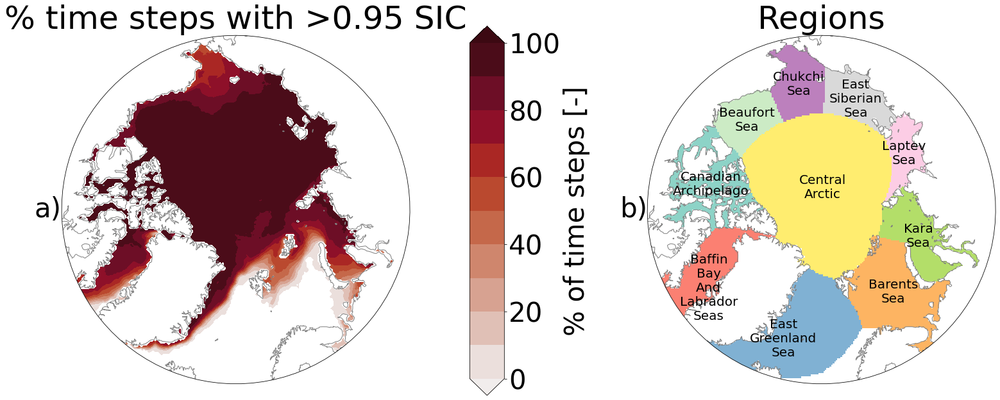

In [6]:
#Figure 1

sic=(np.isfinite(alltime.sic.where(alltime.sic>0.95)).sum('time')/len(alltime.time))

plt.rcParams['font.size']=42

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 2, subplot_kw={'projection': proj})
f.set_figheight(10)
f.set_figwidth(30)

ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
ax[0].coastlines(color='grey')
ax[0].set_title('% time steps with >0.95 SIC')

c=ax[0].contourf(alltime.y, alltime.x, 100*sic.where(sic>(1/227)),vmin=0,vmax=100,levels=np.linspace(0,100,11),
                 extend='both',cmap=cmo.amp,transform=ccrs.epsg(6931))
ax[0].text(-0.04, 0.5, "a)", transform=ax[0].transAxes, va='center', ha='center')

cbar_ax = f.add_axes([0.47, 0.1, 0.025, 0.8])
cb=f.colorbar(c, cax=cbar_ax, label='% of time steps [-]')

ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines(color='grey')
ax[1].set_title('Regions')

d=ax[1].pcolormesh(alltime.y, alltime.x, alltime.rmask,cmap=cm.Set3_r,transform=ccrs.epsg(6931))
ax[1].text(-0.04, 0.5, "b)", transform=ax[1].transAxes, va='center', ha='center')


for i in [1,2,3,4,5,6,7,8,9,12]:
    if i == 9:
        ax[1].text(-1800000,-1800000,rmask_labels[i].replace(' ','\n'), transform=ccrs.epsg(6931), va='bottom', ha='center', fontsize=20)       
    else:
        ax[1].text(alltime.x.where(alltime.rmask==i).mean(skipna=True),alltime.y.where(alltime.rmask==i).mean(skipna=True),rmask_labels[i].replace(' ','\n'), transform=ccrs.epsg(6931), va='center', ha='center', fontsize=20)

plt.savefig(outfp + 'sic_regions.png', bbox_inches="tight")


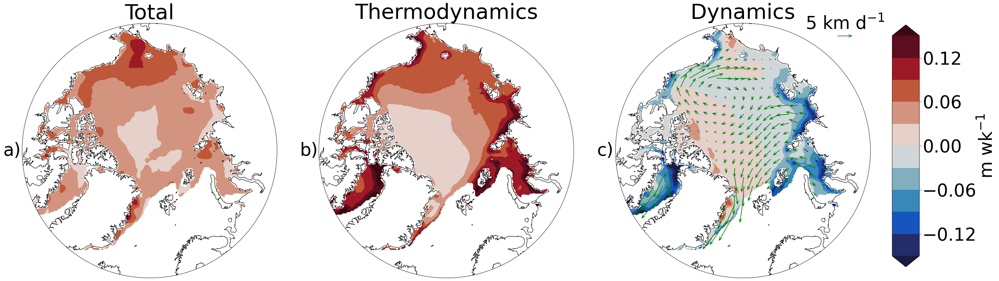

In [5]:
#Figure 2

sic=(np.isfinite(alltime.sic.where(alltime.sic>0.95)).sum('time')/len(alltime.time))

plt.rcParams['font.size']=42

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 3, subplot_kw={'projection': proj})
# ax = ax.ravel()
f.set_figheight(10)
f.set_figwidth(30)

ax[2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[2].set_boundary(circle, transform=ax[2].transAxes)
ax[2].coastlines()
ax[2].set_title('Dynamics')

c=ax[2].contourf(alltime.y, alltime.x, alltime.dyn.mean('time').where(sic>sicthresh),vmin=-0.15,vmax=0.15,levels=np.linspace(-0.15,0.15,11),
                 extend='both',cmap=cmo.balance,transform=ccrs.epsg(6931))
ax[2].text(-0.04, 0.5, "c)", transform=ax[2].transAxes, va='center', ha='center')

ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Thermodynamics')

d=ax[1].contourf(alltime.y, alltime.x, alltime.thm.mean('time').where(sic>sicthresh),levels=np.linspace(-0.15,0.15,11),
                 extend='both',vmin=-0.15, vmax=0.15,cmap=cmo.balance,transform=ccrs.epsg(6931))
ax[1].text(-0.04, 0.5, "b)", transform=ax[1].transAxes, va='center', ha='center')

ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
ax[0].coastlines()
ax[0].set_title('Total')

d=ax[0].contourf(alltime.y, alltime.x, alltime.cs2.diff('time').mean('time').where(sic>sicthresh),levels=np.linspace(-0.15,0.15,11),
                 extend='both',vmin=-0.15, vmax=0.15,cmap=cmo.balance,transform=ccrs.epsg(6931))
ax[0].text(-0.04, 0.5, "a)", transform=ax[0].transAxes, va='center', ha='center')

for i in [2]:

    Q=ax[i].quiver(alltime.x.values[::8], alltime.y.values[::8], alltime.u.mean('time').where(alltime.u.mean('time')!=0).where(sic>0.5).values[::8,::8], alltime.v.mean('time').where(alltime.v.mean('time')!=0).where(sic>0.5).values[::8,::8],color='green',scale=100, headwidth=6, headlength=8)

ax[2].quiverkey(Q, 0.9, 0.95, 5.97, '5 km d$^{-1}$')
    
f.tight_layout()

cbar_ax = f.add_axes([1, 0.1, 0.03, 0.8])
cb=f.colorbar(c, cax=cbar_ax, label='m wk$^{-1}$') 
    
plt.savefig(outfp + 'def_thmdyn.png', bbox_inches="tight")


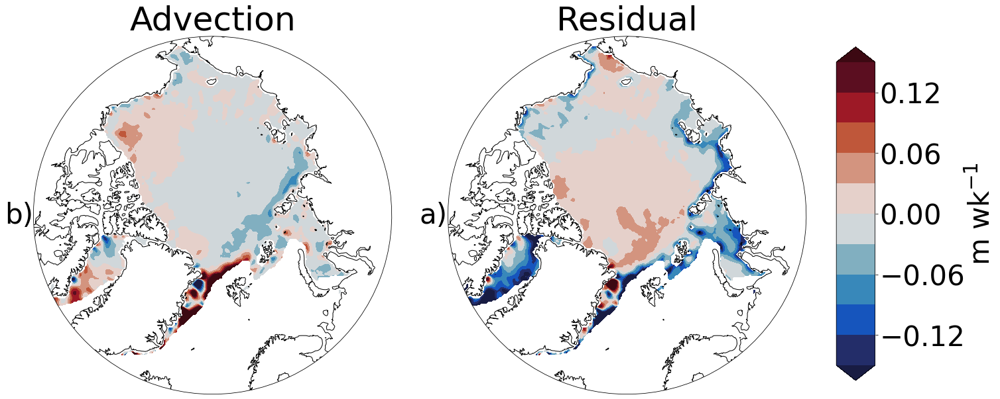

In [6]:
#Figure 3

sic=(np.isfinite(alltime.sic.where(alltime.sic>0.95)).sum('time')/len(alltime.time))


plt.rcParams['font.size']=42

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 2, subplot_kw={'projection': proj})
f.set_figheight(10)
f.set_figwidth(18)

ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Residual')

d=ax[1].contourf(alltime.y, alltime.x,  alltime.dfm.mean('time').where(alltime.rmask!=12).where(sic>sicthresh),
                 levels=np.linspace(-0.15,0.15,11),extend='both',vmin=-0.15, vmax=0.15,cmap=cmo.balance,
                 transform=ccrs.epsg(6931))
ax[1].text(-0.04, 0.5, "a)", transform=ax[1].transAxes, va='center', ha='center')


ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
ax[0].coastlines()
ax[0].set_title('Advection')

adv=alltime.adv.mean('time').where(alltime.rmask!=14)
adv.loc[dict(x=-737500,y=-137500)]=np.nan
d=ax[0].contourf(alltime.y, alltime.x,  adv.where(sic>sicthresh).where(alltime.rmask!=12),
                 levels=np.linspace(-0.15,0.15,11),extend='both',vmin=-0.15, vmax=0.15,cmap=cmo.balance,
                 transform=ccrs.epsg(6931))
ax[0].text(-0.04, 0.5, "b)", transform=ax[0].transAxes, va='center', ha='center')

f.tight_layout()

cbar_ax = f.add_axes([1, 0.15, 0.045, 0.7])
cb=f.colorbar(d, cax=cbar_ax, label='m wk$^{-1}$') 
    
plt.savefig(outfp + 'def_advdef.png', bbox_inches="tight")


In [7]:
#calculate area statistics for results section

print('% area of positive dyn: ' + str((alltime.dyn.mean('time')>0).sum().values/np.isfinite(alltime.dyn.mean('time')).sum().values))
print('% area of positive thm: ' + str((alltime.thm.mean('time')>0).sum().values/np.isfinite(alltime.thm.mean('time')).sum().values))
print('% area of positive adv: ' + str((alltime.adv.mean('time')>0).sum().values/np.isfinite(alltime.adv.mean('time')).sum().values))
print('% area of positive res: ' + str((alltime.dfm.mean('time')>0).sum().values/np.isfinite(alltime.dfm.mean('time')).sum().values))

% area of positive dyn: 0.3042318634423898
% area of positive thm: 1.0
% area of positive adv: 0.3559403271224013
% area of positive res: 0.4297766749379653


/tmp/ipykernel_3761534/734541186.py:17: DeprecationWarning: The outline_patch property is deprecated. Use GeoAxes.spines['geo'] or the default Axes properties instead.
  ax[i,4].outline_patch.set_visible(False)


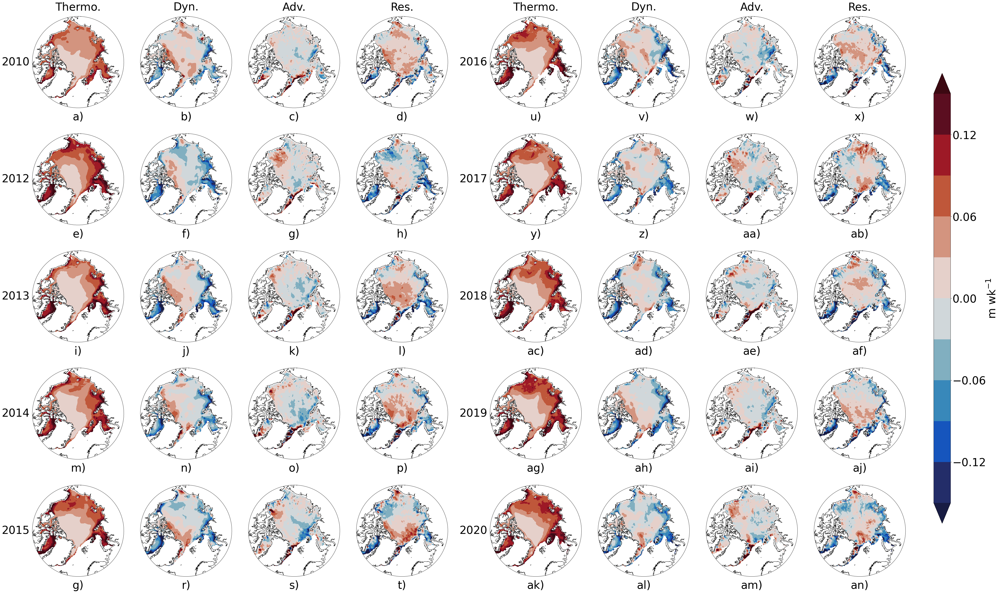

In [7]:
#Figure 4

sic_19monthly=((alltime.sic>0.95).resample(time="1M").sum()/(alltime.sic>0.95).resample(time="1M").count())

plt.rcParams['font.size']=42

labels=np.array(['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)','l)','m)','n)','o)','p)','g)','r)','s)',
       't)','u)','v)','w)','x)','y)','z)','aa)','ab)','ac)','ad)','ae)','af)','ag)','ah)','ai)','aj)','ak)','al)',
       'am)','an)']).reshape(10,4)

fn=glob.glob(deffp + 'thmdyn2*')

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(5,9, subplot_kw={'projection': proj},gridspec_kw={'width_ratios': [1, 1, 1, 1, 0.1, 1, 1, 1, 1]})
for i in range(0,5):
    ax[i,4].outline_patch.set_visible(False)
ax=np.vstack((ax[:,0:4],ax[:,5:9]))
f.set_figheight(40)
f.set_figwidth(60)

for i in range(0,len(fn)):
    thmdyn=xr.open_dataset(fn[i]).where((alltime.rmask>=1) & (alltime.rmask<=9) | (alltime.rmask==12))
    yr=str(thmdyn.time[0].dt.year.values)
    
    sic=(thmdyn.sic>0.95).sum(dim='time')/(thmdyn.sic>0.95).count(dim='time')
    
    ax[i,0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,0].set_boundary(circle, transform=ax[i,0].transAxes)
    ax[i,0].coastlines()
    ax[i,0].text(0.5, -0.1, labels[i,0], transform=ax[i,0].transAxes, va='center', ha='center',fontsize=42)

    d=ax[i,0].contourf(thmdyn.y, thmdyn.x, thmdyn.thm.mean('time').where(sic>sicthresh),cmap=cmo.balance,
                       vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    
    ax[i,1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,1].set_boundary(circle, transform=ax[i,1].transAxes)
    ax[i,1].coastlines()
    ax[i,1].text(0.5, -0.1, labels[i,1], transform=ax[i,1].transAxes, va='center', ha='center',fontsize=42)

    d=ax[i,1].contourf(thmdyn.y, thmdyn.x, thmdyn.dyn.mean('time').where(sic>sicthresh),cmap=cmo.balance,
                       vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))   
    
    ax[i,2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,2].set_boundary(circle, transform=ax[i,2].transAxes)
    ax[i,2].coastlines()
    ax[i,2].text(0.5, -0.1, labels[i,2], transform=ax[i,2].transAxes, va='center', ha='center',fontsize=42)

    d=ax[i,2].contourf(thmdyn.y, thmdyn.x, thmdyn.adv.mean('time').where(sic>sicthresh).where(alltime.rmask!=12),cmap=cmo.balance,
                       vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    
    ax[i,3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,3].set_boundary(circle, transform=ax[i,3].transAxes)
    ax[i,3].coastlines()
    ax[i,3].text(0.5, -0.1, labels[i,3], transform=ax[i,3].transAxes, va='center', ha='center',fontsize=42)

    d=ax[i,3].contourf(thmdyn.y, thmdyn.x, thmdyn.dfm.mean('time').where(sic>sicthresh).where(alltime.rmask!=12),cmap=cmo.balance,
                       vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    
    
cbar_ax = f.add_axes([0.925, 0.2, 0.015, 0.6])
cb=f.colorbar(d, cax=cbar_ax, label='m wk$^{-1}$')


ax[0,0].text(0.5, 1.1, 'Thermo.', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=42)
ax[0,1].text(0.5, 1.1, 'Dyn.', transform=ax[0,1].transAxes, va='center', ha='center', fontsize=42)
ax[0,2].text(0.5, 1.1, 'Adv.', transform=ax[0,2].transAxes, va='center', ha='center', fontsize=42)
ax[0,3].text(0.5, 1.1, 'Res.', transform=ax[0,3].transAxes, va='center', ha='center', fontsize=42)
ax[5,0].text(0.5, 1.1, 'Thermo.', transform=ax[5,0].transAxes, va='center', ha='center', fontsize=42)
ax[5,1].text(0.5, 1.1, 'Dyn.', transform=ax[5,1].transAxes, va='center', ha='center', fontsize=42)
ax[5,2].text(0.5, 1.1, 'Adv.', transform=ax[5,2].transAxes, va='center', ha='center', fontsize=42)
ax[5,3].text(0.5, 1.1, 'Res.', transform=ax[5,3].transAxes, va='center', ha='center', fontsize=42)

ax[0,0].text(-0.18, 0.5, '2010', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=42)
ax[1,0].text(-0.18, 0.5, '2012', transform=ax[1,0].transAxes, va='center', ha='center', fontsize=42)
ax[2,0].text(-0.18, 0.5, '2013', transform=ax[2,0].transAxes, va='center', ha='center', fontsize=42)
ax[3,0].text(-0.18, 0.5, '2014', transform=ax[3,0].transAxes, va='center', ha='center', fontsize=42)
ax[4,0].text(-0.18, 0.5, '2015', transform=ax[4,0].transAxes, va='center', ha='center', fontsize=42)
ax[5,0].text(-0.18, 0.5, '2016', transform=ax[5,0].transAxes, va='center', ha='center', fontsize=42)
ax[6,0].text(-0.18, 0.5, '2017', transform=ax[6,0].transAxes, va='center', ha='center', fontsize=42)
ax[7,0].text(-0.18, 0.5, '2018', transform=ax[7,0].transAxes, va='center', ha='center', fontsize=42)
ax[8,0].text(-0.18, 0.5, '2019', transform=ax[8,0].transAxes, va='center', ha='center', fontsize=42)
ax[9,0].text(-0.18, 0.5, '2020', transform=ax[9,0].transAxes, va='center', ha='center', fontsize=42)

plt.savefig(outfp + 'def_yearly.png', bbox_inches="tight")

/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: divide by zero encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
/home/janheuser/.conda/envs/def/lib/python3.10/site-packages/dask/core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


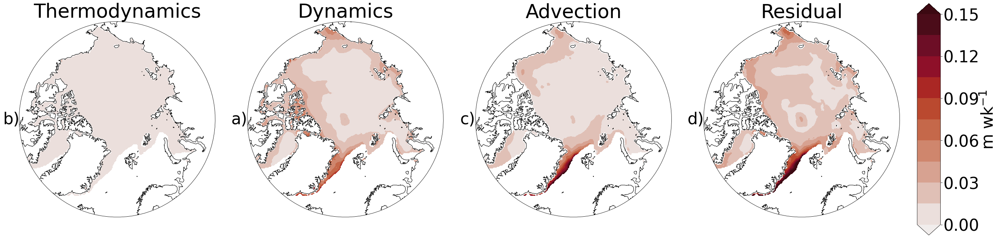

In [9]:
#Figure 5

plt.rcParams['font.size']=40

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 4, subplot_kw={'projection': proj})
ax = ax.ravel()
f.set_figheight(10)
f.set_figwidth(32)

ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Dynamics')

c=ax[1].contourf(alltime.y, alltime.x, np.sqrt(((alltime['dyn_unc']/np.isfinite(alltime.dyn).sum('time'))**2).sum('time', min_count=1)).where(sic>sicthresh),
                 cmap=cmo.amp,vmin=0,vmax=0.15,extend='both',levels=np.linspace(0,0.15,11),transform=ccrs.epsg(6931))
ax[1].text(-0.04, 0.5, "a)", transform=ax[1].transAxes, va='center', ha='center')


ax[3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[3].set_boundary(circle, transform=ax[3].transAxes)
ax[3].coastlines()
ax[3].set_title('Residual')

d=ax[3].contourf(alltime.y, alltime.x, np.sqrt(((alltime['dfm_unc'].where(alltime.rmask!=12)/np.isfinite(alltime.dfm).sum('time'))**2).sum('time', min_count=1)).where(sic>sicthresh),
                   cmap=cmo.amp,vmin=0,vmax=0.15,extend='both',levels=np.linspace(0,0.15,11),transform=ccrs.epsg(6931))
ax[3].text(-0.04, 0.5, "d)", transform=ax[3].transAxes, va='center', ha='center')


ax[2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[2].set_boundary(circle, transform=ax[2].transAxes)
ax[2].coastlines()
ax[2].set_title('Advection')

d=ax[2].contourf(alltime.y, alltime.x, np.sqrt(((alltime['adv_unc'].where(alltime.rmask!=12)/np.isfinite(alltime.adv).sum('time'))**2).sum('time', min_count=1)).where(sic>sicthresh),
                   cmap=cmo.amp,vmin=0,vmax=0.15,extend='both',levels=np.linspace(0,0.15,11),transform=ccrs.epsg(6931))
ax[2].text(-0.04, 0.5, "c)", transform=ax[2].transAxes, va='center', ha='center')


ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes)
ax[0].coastlines()
ax[0].set_title('Thermodynamics')

d=ax[0].contourf(alltime.y, alltime.x, np.sqrt(((alltime['thm_unc']/np.isfinite(alltime.thm).sum('time'))**2).sum('time', min_count=1)).where(sic>sicthresh),
                 cmap=cmo.amp,vmin=0,vmax=0.15,extend='both',levels=np.linspace(0,0.15,11),transform=ccrs.epsg(6931))
ax[0].text(-0.04, 0.5, "b)", transform=ax[0].transAxes, va='center', ha='center')
    
f.tight_layout()

cbar_ax = f.add_axes([1, 0.1, 0.025, 0.8])
cb=f.colorbar(c, cax=cbar_ax, label='m wk$^{-1}$')
    
plt.savefig(outfp + 'def_unc.png', bbox_inches="tight")

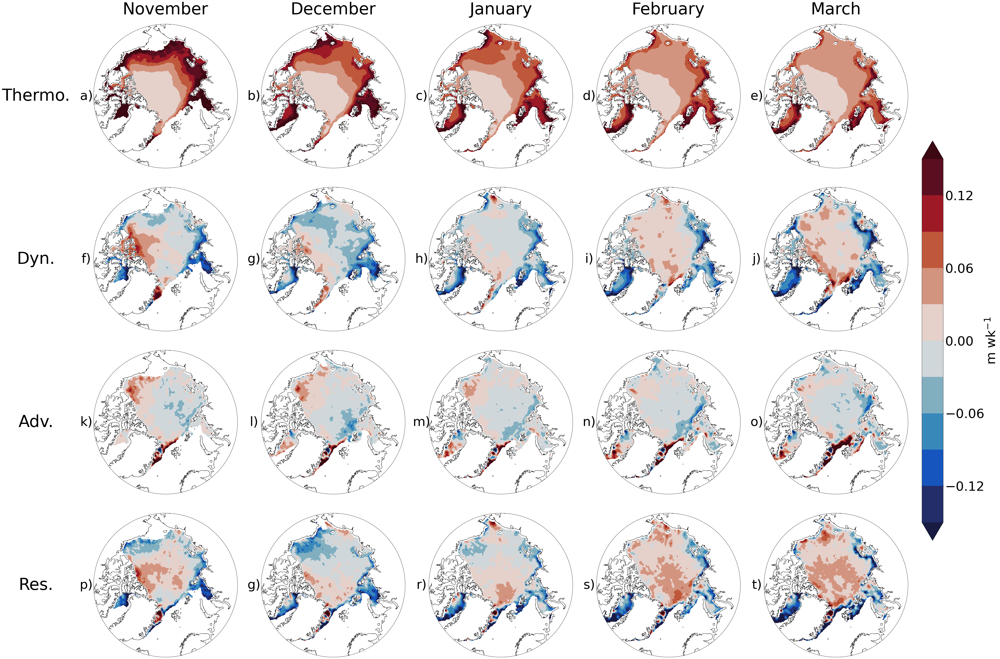

In [10]:
#Figure 6

sic_monthly=((alltime.sic>0.95).groupby(alltime.time.dt.month).sum()/(alltime.sic>0.95).groupby(alltime.time.dt.month).count())

plt.rcParams['font.size']=50


labels=np.array(['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)','l)','m)','n)','o)','p)','g)','r)','s)','t)']).reshape(4,5)

monthly=alltime.groupby(alltime.time.dt.month).mean()

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(4,5, subplot_kw={'projection': proj})
f.set_figheight(36)
f.set_figwidth(46)

months=[11,12,1,2,3]
monname=['Nov.','Dec.','Jan.','Feb.','Mar.']
for i in range(0,len(months)):
    ax[0,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[0,i].set_boundary(circle, transform=ax[0,i].transAxes)
    ax[0,i].coastlines()
    d=ax[0,i].contourf(monthly.y, monthly.x, monthly.thm.sel(month=months[i]).where(sic_monthly.sel(month=months[i])>sicthresh),
                       cmap=cmo.balance,vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[0,i].text(-0.05, 0.5, labels[0,i], transform=ax[0,i].transAxes, va='center', ha='center')

for i in range(0,len(months)):
    ax[1,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[1,i].set_boundary(circle, transform=ax[1,i].transAxes)
    ax[1,i].coastlines()
    d=ax[1,i].contourf(monthly.y, monthly.x, monthly.dyn.sel(month=months[i]).where(sic_monthly.sel(month=months[i])>sicthresh),cmap=cmo.balance,
                       vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[1,i].text(-0.05, 0.5, labels[1,i], transform=ax[1,i].transAxes, va='center', ha='center')


for i in range(0,len(months)):
    ax[2,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[2,i].set_boundary(circle, transform=ax[2,i].transAxes)
    ax[2,i].coastlines()
    d=ax[2,i].contourf(monthly.y, monthly.x, monthly.adv.sel(month=months[i]).where(alltime.rmask!=12).where(sic_monthly.sel(month=months[i])>sicthresh),
                       cmap=cmo.balance,vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[2,i].text(-0.05, 0.5, labels[2,i], transform=ax[2,i].transAxes, va='center', ha='center')

for i in range(0,len(months)):
    ax[3,i].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[3,i].set_boundary(circle, transform=ax[3,i].transAxes)
    ax[3,i].coastlines()
    d=ax[3,i].contourf(monthly.y, monthly.x, monthly.dfm.sel(month=months[i]).where(alltime.rmask!=12).where(sic_monthly.sel(month=months[i])>sicthresh),
                       cmap=cmo.balance,vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[3,i].text(-0.05, 0.5, labels[3,i], transform=ax[3,i].transAxes, va='center', ha='center')

f.tight_layout()

cbar_ax = f.add_axes([1, 0.2, 0.025, 0.6])
cb=f.colorbar(d, cax=cbar_ax, label='m wk$^{-1}$')


ax[0,0].text(0.5, 1.1, 'November', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=64)
ax[0,1].text(0.5, 1.1, 'December', transform=ax[0,1].transAxes, va='center', ha='center', fontsize=64)
ax[0,2].text(0.5, 1.1, 'January', transform=ax[0,2].transAxes, va='center', ha='center', fontsize=64)
ax[0,3].text(0.5, 1.1, 'February', transform=ax[0,3].transAxes, va='center', ha='center', fontsize=64)
ax[0,4].text(0.5, 1.1, 'March', transform=ax[0,4].transAxes, va='center', ha='center', fontsize=64)

ax[0,0].text(-0.4, 0.5, 'Thermo.', transform=ax[0,0].transAxes, va='center', ha='center', fontsize=64)
ax[1,0].text(-0.4, 0.5, 'Dyn.', transform=ax[1,0].transAxes, va='center', ha='center', fontsize=64)
ax[2,0].text(-0.4, 0.5, 'Adv.', transform=ax[2,0].transAxes, va='center', ha='center', fontsize=64)
ax[3,0].text(-0.4, 0.5, 'Res.', transform=ax[3,0].transAxes, va='center', ha='center', fontsize=64)

plt.savefig(outfp + 'def_monthly.png', bbox_inches="tight")

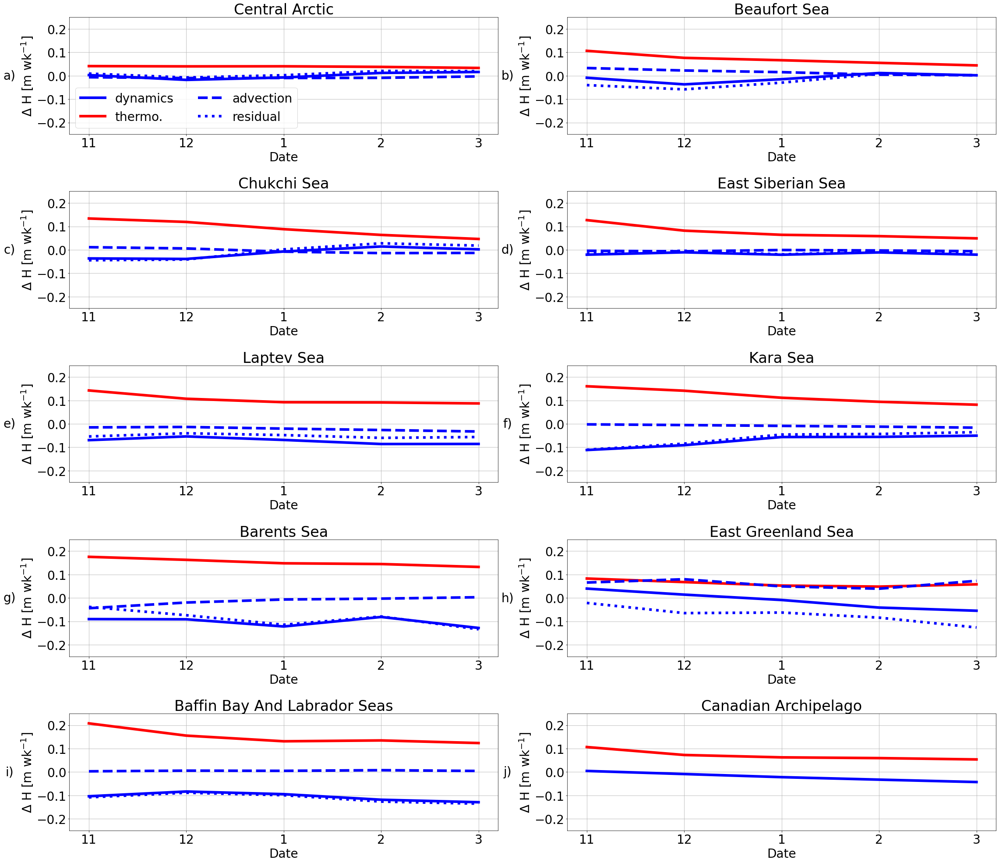

In [11]:
#Figure 7

sic_monthly=((alltime.sic>0.95).groupby(alltime.time.dt.month).sum()/(alltime.sic>0.95).groupby(alltime.time.dt.month).count())

plt.rcParams['font.size']=28

labels=['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)']

f, ax = plt.subplots(5,2)
ax=ax.ravel()
f.set_figheight(28)
f.set_figwidth(32)

for i in [1,2,3,4,5,6,7,8,9,12]:
    if i==12:
        ax[i-3].plot(np.array(['11','12','1','2','3']),alltime.dyn.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='dynamics', linewidth=6, color='b')
        ax[i-3].plot(np.array(['11','12','1','2','3']),alltime.thm.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='thermo.', linewidth=6, color='r')
        ax[i-3].plot(np.array(['11','12','1','2','3']),alltime.adv.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).where(alltime.rmask!=12).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='advection', linewidth=6, linestyle='--', color='b')
        ax[i-3].plot(np.array(['11','12','1','2','3']),alltime.dfm.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).where(alltime.rmask!=12).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='residual', linewidth=6, linestyle=':', color='b')
        ax[i-3].set_ylim(-0.25,0.25)
        ax[i-3].set_ylabel('$\Delta$ H [m wk$^{-1}$]')
        ax[i-3].set_xlabel('Date')
        ax[i-3].set_title(rmask_labels[i])
        ax[i-3].tick_params(axis='x', labelrotation = 0)
        ax[i-3].text(-0.14, 0.5, labels[i-3], transform=ax[i-3].transAxes, va='center', ha='center')
        ax[i-3].grid(visible=True, which='major')
        ax[i-3].set_yticks([-0.2,-0.1,0,0.1,0.2])
    else:        
        ax[i-1].plot(np.array(['11','12','1','2','3']),alltime.dyn.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='dynamics', linewidth=6, color='b')
        ax[i-1].plot(np.array(['11','12','1','2','3']),alltime.thm.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='thermo.', linewidth=6, color='r')
        ax[i-1].plot(np.array(['11','12','1','2','3']),alltime.adv.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).where(alltime.rmask!=12).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='advection', linewidth=6, linestyle='--', color='b')
        ax[i-1].plot(np.array(['11','12','1','2','3']),alltime.dfm.groupby(alltime.time.dt.month).mean(skipna=True).where(sic_monthly>sicthresh).where(alltime.rmask!=12).groupby(alltime.rmask).mean(skipna=True).sel(rmask=i).sel(month=[11,12,1,2,3]), label='residual', linewidth=6, linestyle=':', color='b')
        ax[i-1].set_ylim(-0.25,0.25)
        ax[i-1].set_ylabel('$\Delta$ H [m wk$^{-1}$]')
        ax[i-1].set_xlabel('Date')
        ax[i-1].set_title(rmask_labels[i])
        ax[i-1].tick_params(axis='x', labelrotation = 0)
        ax[i-1].text(-0.14, 0.5, labels[i-1], transform=ax[i-1].transAxes, va='center', ha='center')
        ax[i-1].grid(visible=True, which='major')
        ax[i-1].set_yticks([-0.2,-0.1,0,0.1,0.2])
    
ax[0].legend(loc='lower left', ncol=2)

f.tight_layout()


plt.savefig(outfp + 'def_regmonthly.png', bbox_inches="tight")

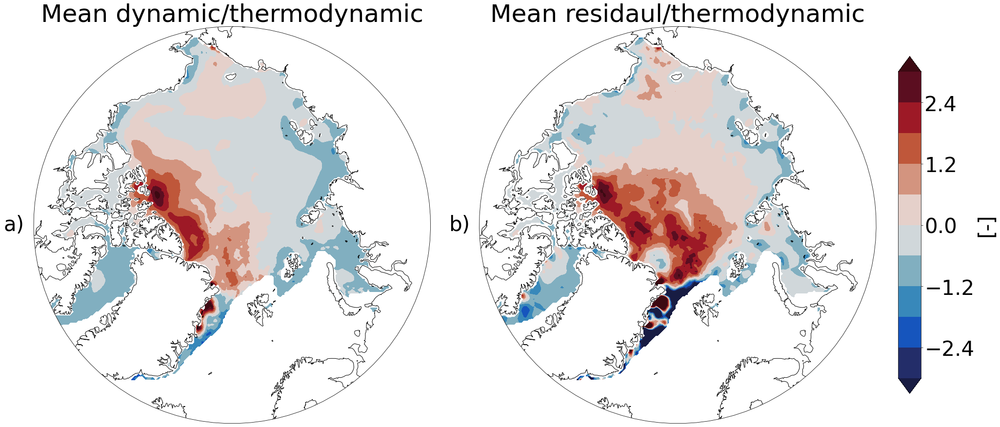

In [12]:
#Figure 8

plt.rcParams['font.size']=42

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(1, 2, subplot_kw={'projection': proj})
ax = ax.ravel()
f.set_figheight(16)
f.set_figwidth(26)

ax[0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[0].set_boundary(circle, transform=ax[0].transAxes) 
ax[0].coastlines()
ax[0].set_title('Mean dynamic/thermodynamic')

d=ax[0].contourf(alltime.y, alltime.x, (alltime.dyn/alltime.thm).mean('time').where(sic>sicthresh),
                 transform=ccrs.epsg(6931),cmap=cmo.balance,vmin=-3,vmax=3,extend='both',levels=np.linspace(-3,3,11))
ax[0].text(-0.05, 0.5, "a)", transform=ax[0].transAxes, va='center', ha='center')


ax[1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
theta = np.linspace(0, 2*np.pi, 100)
center, radius = [0.5, 0.5], 0.5
verts = np.vstack([np.sin(theta), np.cos(theta)]).T
circle = mpath.Path(verts * radius + center)
ax[1].set_boundary(circle, transform=ax[1].transAxes)
ax[1].coastlines()
ax[1].set_title('Mean residaul/thermodynamic')

d=ax[1].contourf(alltime.y, alltime.x,  (alltime.dfm.where(alltime.rmask!=14)/alltime.thm).mean('time').where(sic>sicthresh),
                 transform=ccrs.epsg(6931),cmap=cmo.balance,vmin=-3,vmax=3,extend='both',levels=np.linspace(-3,3,11))
ax[1].text(-0.05, 0.5, "b)", transform=ax[1].transAxes, va='center', ha='center')

f.tight_layout()

cbar_ax = f.add_axes([1, 0.2, 0.025, 0.6])
cb=f.colorbar(d, cax=cbar_ax, label='[-]')

plt.savefig(outfp + 'def_rel.png', bbox_inches="tight")

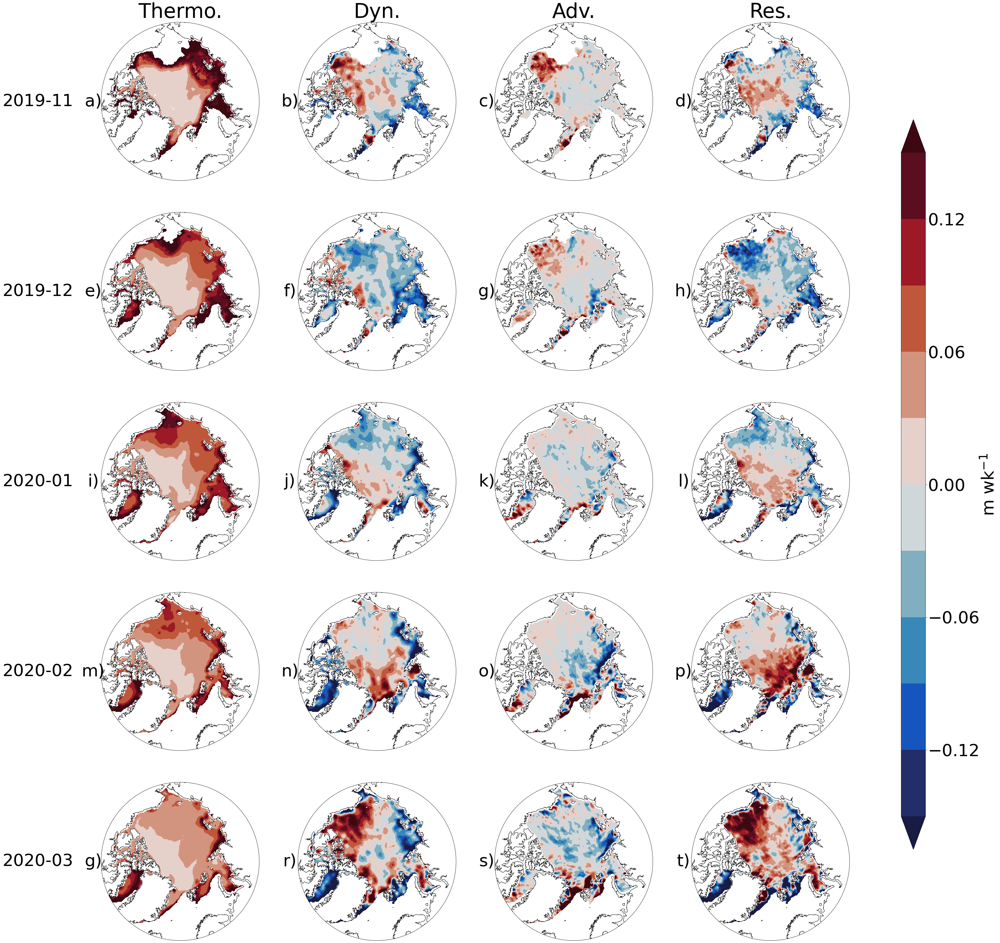

In [13]:
#Figure 9

sic_19monthly=((alltime.sic>0.95).resample(time="1M").sum()/(alltime.sic>0.95).resample(time="1M").count())

plt.rcParams['font.size']=50

labels=np.array(['a)','b)','c)','d)','e)','f)','g)','h)','i)','j)','k)','l)','m)','n)','o)','p)','g)','r)','s)','t)']).reshape(5,4)

proj=ccrs.Stereographic(central_longitude=0, central_latitude=90)

f, ax = plt.subplots(5,4, subplot_kw={'projection': proj})
f.set_figheight(50)
f.set_figwidth(40)


for i in range(0,len(alltime.resample(time="1M").mean().sel(time=slice(date(2019,10,21),date(2020,4,2))).time)-1):
    
    weekly=alltime.resample(time="1M").mean().sel(time=alltime.resample(time="1M").mean().sel(time=slice(date(2019,10,21),date(2020,4,2))).time[i+1])
    sic=sic_19monthly.sel(time=alltime.resample(time="1M").mean().sel(time=slice(date(2019,10,21),date(2020,4,2))).time[i+1])
    
    ax[i,0].text(-0.4, 0.5, weekly.time.dt.date.values[()].strftime('%Y-%m'), transform=ax[i,0].transAxes, va='center', ha='center')

    ax[i,0].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,0].set_boundary(circle, transform=ax[i,0].transAxes)
    ax[i,0].coastlines()
    d=ax[i,0].contourf(weekly.y, weekly.x, weekly.thm.where(sic>sicthresh),
                       cmap=cmo.balance,vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[i,0].text(-0.05, 0.5, labels[i,0], transform=ax[i,0].transAxes, va='center', ha='center')
    
    ax[i,1].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,1].set_boundary(circle, transform=ax[i,1].transAxes)
    ax[i,1].coastlines()
    d=ax[i,1].contourf(weekly.y, weekly.x, weekly.dyn.where(sic>sicthresh),
                       cmap=cmo.balance,vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[i,1].text(-0.05, 0.5, labels[i,1], transform=ax[i,1].transAxes, va='center', ha='center')
           
    ax[i,2].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,2].set_boundary(circle, transform=ax[i,2].transAxes)
    ax[i,2].coastlines()
    d=ax[i,2].contourf(weekly.y, weekly.x, weekly.adv.where(sic>sicthresh).where(alltime.rmask!=12),
                       cmap=cmo.balance,vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[i,2].text(-0.05, 0.5, labels[i,2], transform=ax[i,2].transAxes, va='center', ha='center')

    ax[i,3].set_extent([-180, 180, 65, 90], crs=ccrs.PlateCarree())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax[i,3].set_boundary(circle, transform=ax[i,3].transAxes)
    ax[i,3].coastlines()
    d=ax[i,3].contourf(weekly.y, weekly.x, weekly.dfm.where(sic>sicthresh).where(alltime.rmask!=12),
                       cmap=cmo.balance,vmin=-0.15,vmax=0.15,extend='both',levels=np.linspace(-0.15,0.15,11))
    ax[i,3].text(-0.05, 0.5, labels[i,3], transform=ax[i,3].transAxes, va='center', ha='center')

cbar_ax = f.add_axes([0.95, 0.2, 0.025, 0.6])
cb=f.colorbar(d, cax=cbar_ax, label='m wk$^{-1}$')

ax[0,0].set_title('Thermo.')
ax[0,1].set_title('Dyn.')
ax[0,2].set_title('Adv.')
ax[0,3].set_title('Res.')
    
plt.savefig(outfp + 'def_2019monthly.png', bbox_inches="tight")

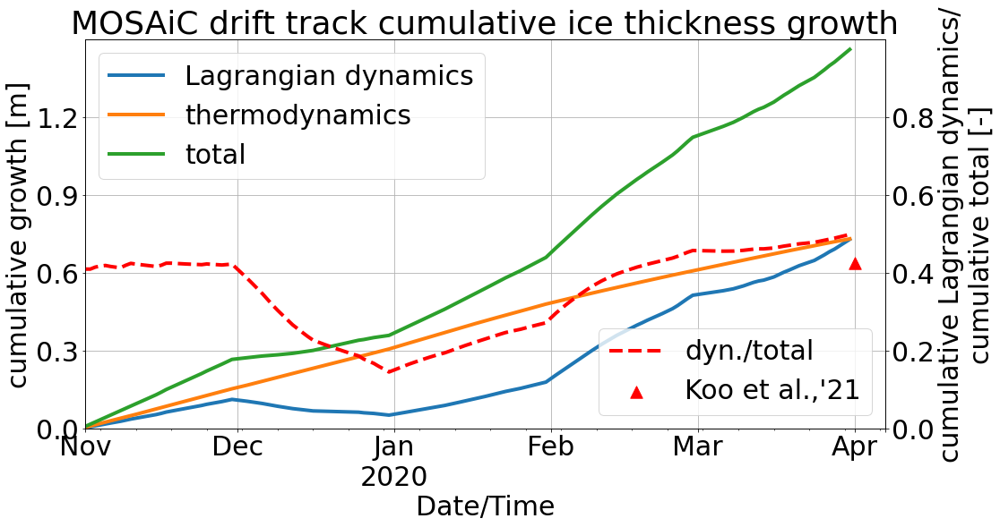

In [11]:
#Figure 10

df=pd.merge_ordered(pd.read_csv(deffp + 'PS122_1_link-to-mastertrack_V2.tab', sep='\t', skiprows=24,parse_dates=True), 
                 pd.read_csv(deffp + 'PS122_2_link-to-mastertrack_V2.tab', sep='\t', skiprows=24,parse_dates=True))
df=pd.merge_ordered(df, pd.read_csv(deffp + 'PS122_3_link-to-mastertrack_V2.tab', sep='\t', skiprows=24))

transformer = Transformer.from_crs(4326, 6931)
x, y = transformer.transform(df.Latitude.values, df.Longitude.values)
df['x']=x
df['y']=y

df['Date/Time']=pd.to_datetime(df['Date/Time'])
df=df.set_index('Date/Time')
df=df.resample('D').mean()
df=df.loc[date(2019,11,1):date(2020,4,1)]

df['dfm']=np.nan
df['thm']=np.nan
df['cs2']=np.nan
df['tsi']=np.nan

for i in range(0,len(df)):
    df['dfm'][i]=alltime.resample(time="1M").mean().sel(time=df.index[i],x=df.x[i],y=df.y[i],method='bfill').dfm
    df['thm'][i]=alltime.resample(time="1M").mean().sel(time=df.index[i],x=df.x[i],y=df.y[i],method='bfill').thm
    df['cs2'][i]=alltime.resample(time="1M").mean().sel(time=df.index[i],x=df.x[i],y=df.y[i],method='bfill').cs2
    df['tsi'][i]=alltime.resample(time="1M").mean().sel(time=df.index[i],x=df.x[i],y=df.y[i],method='bfill').tsi

plt.rcParams['font.size']=30

    
f, ax = plt.subplots(1,1, figsize=(16,8))
plt.title('MOSAiC drift track cumulative ice thickness growth')
    
(df.dfm/7).cumsum().plot(label='Lagrangian dynamics',linewidth=4)
(df.thm/7).cumsum().plot(label='thermodynamics',linewidth=4)
(df.thm/7+df.dfm/7).cumsum().plot(label='total',linewidth=4)
plt.ylim((-0,1.5))
plt.yticks(np.arange(0, 1.5, step=0.3))
ax.set_ylabel('cumulative growth [m]')
ax.grid()
ax.legend()

ax2=ax.twinx()
((df.dfm/7).cumsum()/(df.thm/7+df.dfm/7).cumsum()).plot(color='r',linestyle='dashed',ax=ax2,label='dyn./total',linewidth=4)
plt.ylim((-0,1))
plt.xlim(date(2019,11,1),date(2020,4,7))
ax2.set_ylabel('cumulative Lagrangian dynamics/\ncumulative total [-]')
plt.yticks(np.arange(0, 1, step=0.2))
plt.scatter(date(2020,4,1),.426,marker='^',color='red',s=180,label='Koo et al.,\'21')
ax2.legend(loc=4)

plt.savefig(outfp + 'mosaic.png', bbox_inches="tight")

In [9]:
print('max. thermodynamic growth: ' + str(np.max(df.thm)) + ', min. thermodynamic growth: ' + str(np.min(df.thm)))
print('cumulative thermodynamic growth: ' + str((df.thm/7).cumsum()[-2]))
print('max. dynamic effect: ' + str(np.max(df.dfm)) + ', min. dynamic effect: ' + str(np.min(df.dfm)))
print('cumulative dynamic effect: ' + str((df.dfm/7).cumsum()[-2]))
print('cumulative total change: ' + str((df.dfm/7).cumsum()[-2] + (df.thm/7).cumsum()[-2]))
print('cumulative dynamic effect/cumulative total change: ' + str((df.dfm).cumsum()[-2]/(df.thm+df.dfm).cumsum()[-2]))


max. thermodynamic growth: 0.0411594681349539, min. thermodynamic growth: 0.025552451297855383
cumulative thermodynamic growth: 0.7320493241137378
max. dynamic effect: 0.0966584794973024, min. dynamic effect: -0.025378336832547033
cumulative dynamic effect: 0.7303063401425901
cumulative total change: 1.4623556642563278
cumulative dynamic effect/cumulative total change: 0.4994040492290109
